In [1]:
# ==============================================================================
# KAGGLE SETUP BLOCK (INDEPENDENT BLOCK)
# ==============================================================================
import os
import sys
import subprocess
from pathlib import Path

# Detect Kaggle environment
IS_KAGGLE = 'KAGGLE_KERNEL_RUN_TYPE' in os.environ or os.path.exists('/kaggle/working')

if IS_KAGGLE:
    print("--- Detected Kaggle Environment ---")
    
    # 1. Clone repository if not present
    REPO_URL = "https://github.com/HCMUS-VIR-Nhom8/DINOv3-FAISS-HNSW-SOP-VisualProductSearch.git"
    REPO_DIR = Path("/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch")
    
    if not REPO_DIR.exists():
        print(f"Cloning repository: {REPO_URL}")
        subprocess.run(["git", "clone", REPO_URL, str(REPO_DIR)], check=True)

    # swich to branch "experiments"
    print("Switching to branch: experiments")
    try:
        subprocess.run(["git", "-C", str(REPO_DIR), "checkout", "experiments"], check=True)
    except subprocess.CalledProcessError as e:
        print(f"Error switching branch: {e}. Attempting to fetch first...")
        subprocess.run(["git", "-C", str(REPO_DIR), "fetch", "origin"], check=True)
        subprocess.run(["git", "-C", str(REPO_DIR), "checkout", "experiments"], check=True)
    
    # Change working directory of the kernel to notebooks directory
    # so that PROJECT_ROOT = Path("..").resolve() works correctly
    NOTEBOOKS_DIR = REPO_DIR / "notebooks"
    if NOTEBOOKS_DIR.exists():
        os.chdir(str(NOTEBOOKS_DIR))
        print(f"Changed working directory to: {os.getcwd()}")
        
    # Add project root to sys.path so src imports work
    if str(REPO_DIR) not in sys.path:
        sys.path.insert(0, str(REPO_DIR))
        print("Added repository root to python path.")
        
    # 2. Download and unzip dataset from Google Drive
    DATA_DIR = REPO_DIR / "data" / "raw" / "Stanford_Online_Products"
    ZIP_PATH = REPO_DIR / "Stanford_Online_Products.zip"
    
    if not DATA_DIR.exists() or not (DATA_DIR / "Ebay_train.txt").exists():
        print("Dataset not found. Downloading from Google Drive...")
        
        # Install gdown if needed
        try:
            import gdown
        except ImportError:
            print("Installing gdown...")
            subprocess.run([sys.executable, "-m", "pip", "install", "gdown"], check=True)
            import gdown
            
        # Download Stanford Online Products ZIP
        file_id = "1TclrpQOF_ullUP99wk_gjGN8pKvtErG8"
        url = f"https://drive.google.com/uc?id={file_id}"
        print(f"Downloading from Google Drive ID: {file_id}")
        gdown.download(url, str(ZIP_PATH), quiet=False)
        
        # Extract the zip file
        print("Extracting dataset...")
        import zipfile
        raw_dir = REPO_DIR / "data" / "raw"
        raw_dir.mkdir(parents=True, exist_ok=True)
        with zipfile.ZipFile(str(ZIP_PATH), 'r') as zip_ref:
            zip_ref.extractall(str(raw_dir))
            
        print("Dataset extraction completed.")
        
        # Clean up zip file
        if ZIP_PATH.exists():
            ZIP_PATH.unlink()
            print("Cleaned up ZIP file.")
            
    # Note on HF login for gated DINOv3
    print("\n--- Hugging Face Access Note ---")
    print("DINOv3 is a gated Hugging Face model. If access token is required, run:")
    print("from huggingface_hub import login; login(token='YOUR_HF_TOKEN')\n")
else:
    print("Running in local environment. Setup skipped.")


--- Detected Kaggle Environment ---
Cloning repository: https://github.com/HCMUS-VIR-Nhom8/DINOv3-FAISS-HNSW-SOP-VisualProductSearch.git


Cloning into '/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch'...


Switching to branch: experiments


Switched to a new branch 'experiments'


Branch 'experiments' set up to track remote branch 'experiments' from 'origin'.
Changed working directory to: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/notebooks
Added repository root to python path.
Dataset not found. Downloading from Google Drive...


Downloading...
From (original): https://drive.google.com/uc?id=1TclrpQOF_ullUP99wk_gjGN8pKvtErG8
From (redirected): https://drive.google.com/uc?id=1TclrpQOF_ullUP99wk_gjGN8pKvtErG8&confirm=t&uuid=b06ed2b6-b157-4fbb-8824-8a1c4b4c2652
To: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/Stanford_Online_Products.zip
100%|██████████| 3.08G/3.08G [00:31<00:00, 97.8MB/s]


Extracting dataset...
Dataset extraction completed.
Cleaned up ZIP file.

--- Hugging Face Access Note ---
DINOv3 is a gated Hugging Face model. If access token is required, run:
from huggingface_hub import login; login(token='YOUR_HF_TOKEN')



In [2]:
from pathlib import Path

PROJECT_ROOT = Path("..").resolve()

# ---------------------------------------------------------------------------
# Dataset — PHẢI dùng đúng split đã tạo ở Notebook 02 (baseline). Không
# sampling lại, không tự tạo query/gallery split khác, để so sánh baseline
# vs proposed là fair (cùng gallery, cùng query, cùng ground-truth).
# ---------------------------------------------------------------------------
SPLIT_DIR = PROJECT_ROOT / "data" / "sampled"
SAMPLE_FILE = SPLIT_DIR / "sop_20k.csv"
GALLERY_FILE = SPLIT_DIR / "baseline_gallery.csv"
QUERY_FILE = SPLIT_DIR / "baseline_query.csv"

# Output proposed
OUTPUT_DIR = PROJECT_ROOT / "outputs" / "proposed"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
QUAL_DIR = OUTPUT_DIR / "qualitative"

EMBEDDING_FILE = OUTPUT_DIR / "gallery_embeddings.npy"
GALLERY_META_FILE = OUTPUT_DIR / "gallery_metadata.csv"
HNSW_INDEX_FILE = OUTPUT_DIR / "gallery_hnsw.index"
QUERY_RESULTS_FILE = OUTPUT_DIR / "retrieval_results.npy"
QUERY_SCORES_FILE = OUTPUT_DIR / "retrieval_scores.npy"
METRICS_FILE = OUTPUT_DIR / "metrics.json"
LATENCY_FILE = OUTPUT_DIR / "latency.json"
CONFIG_FILE = OUTPUT_DIR / "config.json"

# ---------------------------------------------------------------------------
# Model — DINOv3. Tên model lấy từ configs/proposed.yaml của repo, KHÔNG
# hard-code khác đi. DINOV3_LOCAL_PATH cho phép trỏ tới checkpoint cục bộ
# (thư mục chứa config.json/model weights kiểu HuggingFace) thay vì Hub.
# ---------------------------------------------------------------------------
DINOV3_MODEL_NAME = "facebook/dinov3-vitb16-pretrain-lvd1689m"  # configs/proposed.yaml -> model.name
DINOV3_LOCAL_PATH = None  # vd: "/path/to/local/dinov3-checkpoint"
MODEL_SOURCE = DINOV3_LOCAL_PATH if DINOV3_LOCAL_PATH else DINOV3_MODEL_NAME

# ---------------------------------------------------------------------------
# Preprocessing — theo đúng ProposedPreprocessor (src/preprocessing/pipeline.py)
# và giá trị mặc định trong configs/proposed.yaml. Localization/segmentation
# (Grounding DINO / SAM) KHÔNG được bật: tài liệu phương pháp (mục 4.1.2.3)
# mô tả đây là các thành phần "có thể thay thế" trong prototype, và repo
# hiện chưa gắn checkpoint thật cho hai bước này (CONFIGURABLE, không phải
# method chính thức bắt buộc).
# ---------------------------------------------------------------------------
RESIZE_LONG_SIDE = 1024
TARGET_SIZE = 518            # kích thước sau letterbox
IMAGE_SIZE = TARGET_SIZE     # alias cho đúng tên biến yêu cầu trong đề bài
PADDING_RATIO = 0.10          # chưa dùng vì localization/segmentation đang tắt
BLUR_THRESHOLD = 50.0
JPEG_THRESHOLD = 8.0
USE_ILLUMINATION_CORRECTION = True
CLAHE_CLIP_LIMIT = 2.0

BATCH_SIZE = 16
NUM_WORKERS = 2

# ---------------------------------------------------------------------------
# FAISS HNSW — mặc định lấy từ configs/proposed.yaml (mục 4.1.7 trong tài
# liệu phương pháp). Đổi ở đây để thử nghiệm đánh đổi recall/latency/memory.
# ---------------------------------------------------------------------------
HNSW_M = 32
HNSW_EF_CONSTRUCTION = 200
HNSW_EF_SEARCH = 64

# ---------------------------------------------------------------------------
# Metadata re-ranking — dùng ĐÚNG công thức đã hiện thực trong
# src/reranking/metadata.py::category_consistency_rerank (không tự bịa công
# thức khác — xem mục 14 của yêu cầu).
#
# LƯU Ý QUAN TRỌNG (xem README của repo): SOP không có metadata dạng
# title/brand/mô tả văn bản cho ảnh truy vấn. Do đó công thức này KHÔNG so
# khớp metadata của query với candidate (không phải oracle match), mà tính
# điểm đồng thuận (consensus) super_class_id ngay trong tập Top-N candidate:
#
#     meta_score(candidate) = tần suất super_class_id của candidate đó
#                              trong Top-N candidates / N
#     final_score = alpha_visual * visual_score_normalized
#                   + (1 - alpha_visual) * meta_score
#
# Đây là một CONFIGURABLE EXPERIMENTAL CHOICE đã được README của repo xác
# nhận, KHÔNG PHẢI một công thức chính thức đã được đề tài chứng minh tối
# ưu. Nếu có metadata text/brand thật, hãy thay hàm rerank tương ứng thay vì
# coi category-consistency là mặc định vĩnh viễn.
# ---------------------------------------------------------------------------
ENABLE_RERANKING = True
RERANK_CANDIDATES = 100      # = retrieval.candidate_k trong configs/proposed.yaml
ALPHA_VISUAL = 0.85          # = reranking.alpha_visual trong configs/proposed.yaml
VISUAL_WEIGHT = ALPHA_VISUAL
METADATA_WEIGHT = 1.0 - ALPHA_VISUAL

# ---------------------------------------------------------------------------
# Evaluation — PHẢI trùng KS đã dùng ở Notebook 02 để so sánh công bằng.
# ---------------------------------------------------------------------------
KS = [1, 5, 10, 20, 50, 100]
MAX_QUERIES = None           # None = toàn bộ query set
RANDOM_SEED = 42

# Device — đổi thành "cpu" nếu không có GPU.
DEVICE = "cuda"

N_QUALITATIVE = 20            # số lượng ảnh minh họa xuất ra qualitative/

print("PROJECT_ROOT :", PROJECT_ROOT)
print("GALLERY_FILE :", GALLERY_FILE)
print("QUERY_FILE   :", QUERY_FILE)
print("OUTPUT_DIR   :", OUTPUT_DIR)
print("MODEL_SOURCE :", MODEL_SOURCE)

PROJECT_ROOT : /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch
GALLERY_FILE : /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/data/sampled/baseline_gallery.csv
QUERY_FILE   : /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/data/sampled/baseline_query.csv
OUTPUT_DIR   : /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed
MODEL_SOURCE : facebook/dinov3-vitb16-pretrain-lvd1689m


In [3]:
%pip install faiss-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.2/135.2 MB 2.6 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
import os
import sys
import json
import time
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.auto import tqdm

import torch
import transformers

try:
    import faiss
except ImportError as e:
    raise ImportError(
        "Không import được faiss. Cài đặt bằng:\n"
        "  pip install faiss-cpu   # hoặc faiss-gpu nếu có CUDA phù hợp\n"
        f"Lỗi gốc: {e}"
    )

# Cho phép "from src...." hoạt động khi notebook chạy từ thư mục notebooks/
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

print("Python      :", sys.version.split()[0])
print("PyTorch     :", torch.__version__)
print("Transformers:", transformers.__version__)
print("FAISS       :", getattr(faiss, "__version__", "n/a"))
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
elif DEVICE == "cuda":
    print(
        "\u26a0 DEVICE='cuda' nhưng không có GPU khả dụng. "
        "Hãy đổi DEVICE='cpu' ở Cell Configuration trước khi chạy tiếp."
    )

Python      : 3.12.13
PyTorch     : 2.10.0+cu128
Transformers: 5.0.0
FAISS       : 1.15.0
CUDA available: True
GPU: Tesla T4


In [5]:
# Theo mục 23 của yêu cầu: dùng lại module đã có trong src/ thay vì viết lại.
try:
    from src.preprocessing.pipeline import ProposedPreprocessor
    from src.models.encoder import DINOv3Encoder
    from src.retrieval.hnsw import HNSWRetriever
    from src.reranking.metadata import category_consistency_rerank
except ImportError as e:
    raise ImportError(
        "Không import được các module trong src/. Kiểm tra:\n"
        "  1. Notebook đang chạy từ thư mục notebooks/ (PROJECT_ROOT = ..)\n"
        "  2. Repo có đầy đủ src/preprocessing/pipeline.py, src/models/encoder.py, "
        "src/retrieval/hnsw.py, src/reranking/metadata.py\n"
        f"Lỗi gốc: {e}"
    )

print("\u2713 Đã import ProposedPreprocessor, DINOv3Encoder, HNSWRetriever, "
      "category_consistency_rerank từ src/.")

✓ Đã import ProposedPreprocessor, DINOv3Encoder, HNSWRetriever, category_consistency_rerank từ src/.


In [6]:
gallery_df = pd.read_csv(GALLERY_FILE).reset_index(drop=True)
query_df = pd.read_csv(QUERY_FILE).reset_index(drop=True)

print("Gallery:", len(gallery_df), "| classes:", gallery_df["class_id"].nunique())
print("Query  :", len(query_df), "| classes:", query_df["class_id"].nunique())

display(gallery_df.head())

Gallery: 10000 | classes: 10000
Query  : 10000 | classes: 10000


,image_id,class_id,super_class_id,path,image_path,source_split,exists
0,1,1,1,bicycle_final/111085122871_0.JPG,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...,train,True
1,36,6,1,bicycle_final/111476691561_4.JPG,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...,train,True
2,65,11,1,bicycle_final/111588452395_2.JPG,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...,train,True
3,70,13,1,bicycle_final/111611735309_1.JPG,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...,train,True
4,76,14,1,bicycle_final/111612717975_4.JPG,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...,train,True


In [7]:
required_columns = {"image_id", "class_id", "image_path"}

for name, df in [("gallery_df", gallery_df), ("query_df", query_df)]:
    missing_cols = required_columns - set(df.columns)
    if missing_cols:
        raise ValueError(f"{name} thiếu cột bắt buộc: {missing_cols}")

# Mỗi query class phải có ít nhất 1 ảnh trong gallery (positive tồn tại)
missing_query_classes = set(query_df["class_id"]) - set(gallery_df["class_id"])
assert len(missing_query_classes) == 0, (
    f"{len(missing_query_classes)} class trong query không có ảnh gallery tương ứng."
)

# Query và gallery không được trùng image_id (tránh self-retrieval ảo)
overlap = set(query_df["image_id"]) & set(gallery_df["image_id"])
assert len(overlap) == 0, f"Query và gallery bị overlap {len(overlap)} image_id."

# Kiểm tra image path tồn tại trên đĩa
for name, df in [("gallery_df", gallery_df), ("query_df", query_df)]:
    exists = df["image_path"].map(os.path.exists)
    if not exists.all():
        n_missing = int((~exists).sum())
        raise FileNotFoundError(f"{name} có {n_missing} image_path không tồn tại trên đĩa.")

# Reranking cần super_class_id — nếu thiếu, báo lỗi rõ ràng thay vì âm thầm tắt.
if ENABLE_RERANKING and "super_class_id" not in gallery_df.columns:
    raise ValueError(
        "ENABLE_RERANKING=True nhưng gallery_df không có cột 'super_class_id'.\n"
        "category_consistency_rerank() cần cột này để tính metadata score.\n"
        "Hãy đảm bảo Notebook 01 giữ lại cột super_class_id khi tạo sop_20k.csv, "
        "hoặc đặt ENABLE_RERANKING = False ở Cell Configuration để chạy HNSW-only."
    )

print(
    "\u2713 Split hợp lệ: không overlap, mọi query class đều có gallery, "
    "mọi image_path tồn tại"
    + (", có super_class_id cho reranking." if ENABLE_RERANKING else ".")
)

✓ Split hợp lệ: không overlap, mọi query class đều có gallery, mọi image_path tồn tại, có super_class_id cho reranking.


In [8]:
!pip install python-dotenv

In [ ]:
# !hf auth login --token SECRET_HF_TOKEN--add-to-git-credential
import os, sys
from dotenv import load_dotenv
from huggingface_hub import login

# khi chay duoi local
load_dotenv()
HF_TOKEN = os.getenv("SECRET_HF_TOKEN")
try:
    login(token=HF_TOKEN)
    print("✅ Hugging Face login successful")
except Exception as exc:
    print("⚠️ Hugging Face login failed – proceeding with token‑only loading", exc,
          file=sys.stderr)

✅ Hugging Face login successful


In [10]:
try:
    dinov3 = DINOv3Encoder(MODEL_SOURCE, DEVICE)
except Exception as e:
    raise RuntimeError(
        f"Không load được DINOv3 ({MODEL_SOURCE}).\n"
        "Nguyên nhân thường gặp:\n"
        "  1. Chưa đăng nhập Hugging Face hoặc chưa được cấp quyền truy cập "
        "model gated -> chạy `huggingface-cli login` và xin quyền tại trang "
        "model card trên huggingface.co.\n"
        "  2. Không có kết nối mạng tới huggingface.co.\n"
        "  3. DINOV3_LOCAL_PATH (Cell Configuration) trỏ sai đường dẫn checkpoint cục bộ.\n"
        f"Lỗi gốc: {e}"
    )

print("\u2713 Đã load DINOv3Encoder")
print("Device       :", dinov3.device)
print("Embedding dim:", dinov3.dim)

preprocessor_config.json:   0%|          | 0.00/585 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/744 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/211 [00:00<?, ?it/s]

✓ Đã load DINOv3Encoder
Device       : cuda
Embedding dim: 768


In [11]:
# LƯU Ý: DINOv3Encoder.__init__ (src/models/encoder.py) hiện chỉ gọi
# .to(device).eval() và CHƯA tự set requires_grad_(False) cho tham số.
# Để đúng yêu cầu "frozen backbone" của tài liệu phương pháp (mục 4.1.3.3:
# "Có thể sử dụng như một backbone đóng băng"), notebook tự đóng băng tường
# minh ở đây.
# TODO (repo): cân nhắc chuyển đoạn freeze này vào DINOv3Encoder.__init__.
for p in dinov3.model.parameters():
    p.requires_grad_(False)

num_params = sum(p.numel() for p in dinov3.model.parameters())
num_trainable = sum(p.numel() for p in dinov3.model.parameters() if p.requires_grad)

print("Tổng số tham số     :", f"{num_params:,}")
print("Tham số có thể train:", f"{num_trainable:,}")
print("model.training =", dinov3.model.training)

assert num_trainable == 0, "DINOv3 backbone chưa được đóng băng hoàn toàn."
assert dinov3.model.training is False, "DINOv3 model chưa ở chế độ eval()."

print("\u2713 Backbone đã đóng băng và ở chế độ eval — đúng yêu cầu frozen backbone.")

Tổng số tham số     : 85,660,416
Tham số có thể train: 0
model.training = False
✓ Backbone đã đóng băng và ở chế độ eval — đúng yêu cầu frozen backbone.


In [12]:
# Load offline proposed embeddings and HNSW index
from src.retrieval.hnsw import HNSWRetriever

if not EMBEDDING_FILE.exists() or not GALLERY_META_FILE.exists() or not HNSW_INDEX_FILE.exists():
    raise FileNotFoundError(
        f"Offline proposed embeddings/index not found under {OUTPUT_DIR}. "
        f"Please run the offline notebook (03_proposed_offline.ipynb) first."
    )

gallery_embeddings = np.load(EMBEDDING_FILE)
gallery_df = pd.read_csv(GALLERY_META_FILE).reset_index(drop=True)
hnsw_retriever = HNSWRetriever.load(HNSW_INDEX_FILE)

# Placeholders for variables referenced in evaluation
hnsw_build_time = 0.0
gallery_encode_time = 0.0

print("Loaded offline proposed artifacts:")
print("Gallery Embeddings Shape:", gallery_embeddings.shape)
print("HNSW Index ntotal       :", hnsw_retriever.index.ntotal)


Loaded offline proposed artifacts:
Gallery Embeddings Shape: (10000, 768)
HNSW Index ntotal       : 10000


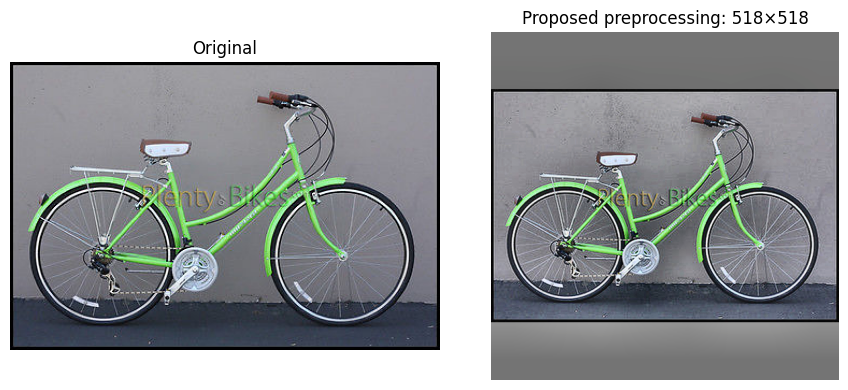

blur_score: 196.75783953625017 | flags: {'blur_flag': False, 'jpeg_flag': False}
Lưu ý: AutoImageProcessor của HuggingFace sẽ áp dụng thêm resize/normalize riêng của DINOv3 lên ảnh đã letterbox này khi gọi dinov3.encode() — đây là thiết kế sẵn có của repo (DINOv3Encoder), không phải augmentation bổ sung do notebook này thêm vào.


In [13]:
proposed_preprocessor = ProposedPreprocessor(
    resize_long_side=RESIZE_LONG_SIDE,
    target_size=TARGET_SIZE,
    padding_ratio=PADDING_RATIO,
    blur_threshold=BLUR_THRESHOLD,
    jpeg_threshold=JPEG_THRESHOLD,
    use_illumination=USE_ILLUMINATION_CORRECTION,
    clahe_clip_limit=CLAHE_CLIP_LIMIT,
)

preview_row = gallery_df.iloc[0]
preview_original = Image.open(preview_row["image_path"]).convert("RGB")
preview_output = proposed_preprocessor(preview_row["image_path"])

plt.figure(figsize=(9, 4))
ax = plt.subplot(1, 2, 1)
ax.imshow(preview_original)
ax.set_title("Original")
ax.axis("off")

ax = plt.subplot(1, 2, 2)
ax.imshow(preview_output.image)
ax.set_title(f"Proposed preprocessing: {TARGET_SIZE}\u00d7{TARGET_SIZE}")
ax.axis("off")
plt.tight_layout()
plt.show()

print("blur_score:", preview_output.blur_score, "| flags:", preview_output.metadata)
print(
    "Lưu ý: AutoImageProcessor của HuggingFace sẽ áp dụng thêm resize/normalize "
    "riêng của DINOv3 lên ảnh đã letterbox này khi gọi dinov3.encode() — đây là "
    "thiết kế sẵn có của repo (DINOv3Encoder), không phải augmentation bổ sung "
    "do notebook này thêm vào."
)

In [14]:
def encode_query(image_path, preprocessor, encoder, device):
    """
    Online query encoding: load ảnh -> preprocessing đề xuất -> DINOv3 -> L2.

    Trả về (embedding [1, D], elapsed_seconds). Đo latency RIÊNG cho bước
    này — không gộp với search/rerank (mục 11 và 17 của yêu cầu).
    """
    out = preprocessor(image_path)

    if device == "cuda" and torch.cuda.is_available():
        torch.cuda.synchronize()
    start = time.perf_counter()

    embedding = encoder.encode([out.image])  # đã L2-normalize bên trong

    if device == "cuda" and torch.cuda.is_available():
        torch.cuda.synchronize()
    elapsed = time.perf_counter() - start

    return embedding, elapsed

### Cell 22 — Test encode_query trên 1 query

In [15]:
query_row = query_df.iloc[0]
q_embedding, q_encode_time = encode_query(
    query_row["image_path"], proposed_preprocessor, dinov3, DEVICE
)

print("Query image_id:", query_row["image_id"], "| GT class:", query_row["class_id"])
print("Embedding shape:", q_embedding.shape)
print(f"Encoding latency: {q_encode_time * 1000:.2f} ms")
assert np.allclose(np.linalg.norm(q_embedding, axis=1), 1.0, atol=1e-4)

Query image_id: 7 | GT class: 1
Embedding shape: (1, 768)
Encoding latency: 898.17 ms


## 9. HNSW ANN Search

### Cell 23 — Hàm hnsw_search()

In [16]:
def hnsw_search(query_embedding, index, candidate_k):
    """
    ANN search trên FAISS HNSW. Trả về (ids, scores, elapsed_seconds).
    Đo latency RIÊNG cho search, tách khỏi encoding và reranking.
    """
    start = time.perf_counter()
    scores, ids = index.search(query_embedding, candidate_k)
    elapsed = time.perf_counter() - start
    return ids, scores, elapsed


q_ids, q_scores, q_search_time = hnsw_search(q_embedding, hnsw_retriever, RERANK_CANDIDATES)
print(f"Search latency: {q_search_time * 1000:.2f} ms")
print("Top-5 candidate ids    :", q_ids[0, :5])
print("Top-5 candidate scores :", q_scores[0, :5])

Search latency: 1.39 ms
Top-5 candidate ids    : [  17 5109 5277   27 5164]
Top-5 candidate scores : [0.8095089  0.6647965  0.62647724 0.62505174 0.6157494 ]


### Cell 24 — Xem Top-10 kết quả (trước reranking)

In [17]:
def safe_class_lookup(ids_row, class_id_array):
    """
    Tra class_id theo vị trí, KHÔNG dùng numpy negative-index cho id=-1
    (FAISS trả -1 khi không đủ candidate) — tránh lỗi âm thầm trỏ nhầm
    phần tử cuối của mảng (mục 28 của yêu cầu: không silently ignore lỗi).
    """
    ids_row = np.asarray(ids_row)
    out = np.full(ids_row.shape, -1, dtype="int64")
    valid = ids_row >= 0
    out[valid] = np.asarray(class_id_array)[ids_row[valid]]
    return out


rows = []
retrieved_classes_preview = safe_class_lookup(q_ids[0][:10], gallery_df["class_id"].to_numpy())
for rank, (idx, score, cls) in enumerate(
    zip(q_ids[0][:10], q_scores[0][:10], retrieved_classes_preview), start=1
):
    rows.append({
        "rank": rank,
        "gallery_index": int(idx),
        "class_id": int(cls),
        "similarity": float(score),
        "correct": int(cls) == int(query_row["class_id"]),
    })

display(pd.DataFrame(rows))

,rank,gallery_index,class_id,similarity,correct
0,1,17,36,0.809509,False
1,2,5109,11356,0.664796,False
2,3,5277,11751,0.626477,False
3,4,27,62,0.625052,False
4,5,5164,11480,0.615749,False
5,6,170,400,0.602579,False
6,7,192,446,0.584716,False
7,8,46,96,0.584713,False
8,9,236,540,0.578794,False
9,10,233,536,0.572963,False


## 10. RRT Re-ranking (Reranking Transformer)

Thay hoàn toàn `category_consistency_rerank` (metadata / đồng thuận
`super_class_id`) bằng **RRT — Reranking Transformer**
(`uvavision/RerankingTransformer`, thư mục `RRT_SOP`), theo đúng các bước đã
thử nghiệm trong `rrt-experiment.ipynb`:

- Clone repo gốc `RerankingTransformer` và vá `models/architectures/resnet.py`
  để tương thích torchvision hiện tại (giống đúng bước vá trong
  `rrt-experiment.ipynb`: `model_urls` / `load_state_dict_from_url`).
- Tải checkpoint chính thức **`rrt_r50_sop_rerank_frozen.pt`** (reranking,
  frozen backbone) từ HuggingFace Hub `fwtan/rrt_sop_data` (nguồn được nêu
  trong README của repo).
- Với mỗi ảnh (query và từng candidate), trích **local feature map** `[C,H,W]`
  bằng ResNet50 RIÊNG của RRT — KHÔNG dùng lại embedding DINOv3 (RRT cần
  feature map cục bộ của đúng backbone đã huấn luyện cùng `MatchERT`, không
  phải vector toàn cục dùng cho HNSW).
- Dùng `MatchERT` (Transformer encoder so khớp local feature theo từng cặp
  query–candidate, đúng như `eval_rerank.py`/`recall_at_ks_rerank` của repo
  gốc) để tính `rrt_score` cho từng candidate trong tập Top-N đã lấy từ HNSW.
- Kết hợp với visual score gốc theo đúng công thức blending đã có sẵn ở Cell
  Configuration (giữ nguyên biến `ALPHA_VISUAL` để phần còn lại của notebook
  không cần đổi):

      rrt_score_norm     = min-max normalize(rrt_score) trong Top-N
      visual_score_norm  = min-max normalize(visual_score) trong Top-N
      final_score        = ALPHA_VISUAL * visual_score_norm
                            + (1 - ALPHA_VISUAL) * rrt_score_norm

Đây LÀ một phương pháp re-ranking đã được huấn luyện/công bố (RRT), dùng lại
checkpoint train sẵn trên chính Stanford Online Products — khác với bản cũ
vốn chỉ là một heuristic đồng thuận category tự nghĩ ra vì SOP thiếu metadata
văn bản thật cho query.

### Cell 25 — Hàm rerank_candidates() + test trên 1 query

In [ ]:
# ---------------------------------------------------------------------------
# RRT (Reranking Transformer) — setup: clone repo gốc, vá tương thích
# torchvision, tải checkpoint, load model. Dựa đúng theo các bước đã thử
# trong rrt-experiment.ipynb (https://github.com/uvavision/RerankingTransformer,
# thư mục RRT_SOP).
# ---------------------------------------------------------------------------
import subprocess

RRT_REPO_DIR = PROJECT_ROOT / "external" / "RerankingTransformer"
RRT_SOP_DIR = RRT_REPO_DIR / "RRT_SOP"

if not RRT_SOP_DIR.exists():
    print("Cloning uvavision/RerankingTransformer...")
    subprocess.run(
        ["git", "clone", "--depth", "1",
         "https://github.com/uvavision/RerankingTransformer.git", str(RRT_REPO_DIR)],
        check=True,
    )

if str(RRT_SOP_DIR) not in sys.path:
    sys.path.insert(0, str(RRT_SOP_DIR))

# Vá models/architectures/resnet.py cho tương thích torchvision mới — đúng
# bước vá đã làm trong rrt-experiment.ipynb (repo RRT public từ 2021 dùng API
# torchvision cũ: model_urls, torchvision.models.utils.load_state_dict_from_url).
_rrt_resnet_file = RRT_SOP_DIR / "models" / "architectures" / "resnet.py"
_rrt_resnet_text = _rrt_resnet_file.read_text()
_rrt_resnet_patched = _rrt_resnet_text
_rrt_resnet_patched = _rrt_resnet_patched.replace(
    "from torchvision.models.resnet import conv1x1, BasicBlock, Bottleneck, model_urls",
    "from torchvision.models.resnet import conv1x1, BasicBlock, Bottleneck",
)
_rrt_resnet_patched = _rrt_resnet_patched.replace(
    "from torchvision.models.utils import load_state_dict_from_url",
    "from torch.hub import load_state_dict_from_url",
)
if "model_urls = {" not in _rrt_resnet_patched:
    _rrt_resnet_patched = _rrt_resnet_patched.replace(
        "from copy import deepcopy",
        "from copy import deepcopy\n\nmodel_urls = {\n"
        "    'resnet50': 'https://download.pytorch.org/models/resnet50-0676ba61.pth',\n"
        "}\n",
    )
if _rrt_resnet_patched != _rrt_resnet_text:
    _rrt_resnet_file.write_text(_rrt_resnet_patched)
    print("Đã vá models/architectures/resnet.py cho torchvision mới.")
else:
    print("models/architectures/resnet.py đã ở dạng tương thích (không cần vá lại).")

from models.architectures.resnet import resnet50 as rrt_resnet50  # noqa: E402

# ---------------------------------------------------------------------------
# Checkpoint — rrt_r50_sop_rerank_frozen.pt (reranking, frozen backbone),
# tải từ HuggingFace Hub fwtan/rrt_sop_data (nguồn chính thức trong README
# của repo RerankingTransformer/RRT_SOP).
# ---------------------------------------------------------------------------
from huggingface_hub import hf_hub_download

try:
    RRT_CHECKPOINT_PATH = hf_hub_download(
        repo_id="fwtan/rrt_sop_data",
        filename="rrt_sop_ckpts/rrt_r50_sop_rerank_frozen.pt",
    )
except Exception as e:
    raise RuntimeError(
        "Không tải được checkpoint RRT từ HuggingFace Hub (fwtan/rrt_sop_data).\n"
        "Nếu môi trường không có mạng ra ngoài tới huggingface.co, hãy tải thủ công "
        "'rrt_sop_ckpts/rrt_r50_sop_rerank_frozen.pt' theo README tại "
        "https://github.com/uvavision/RerankingTransformer/tree/main/RRT_SOP rồi gán "
        "đường dẫn cục bộ vào biến RRT_CHECKPOINT_PATH.\n"
        f"Lỗi gốc: {e}"
    )

RRT_NUM_LOCAL_FEATURES = 128

rrt_model = rrt_resnet50(
    pretrained=False,
    num_classes=1,  # classifier không dùng cho rerank — bị loại bỏ khi load checkpoint bên dưới
    num_global_features=128,
    num_local_features=RRT_NUM_LOCAL_FEATURES,
    normalize=True,
    ert_seq_len=102,
    ert_dim_feedforward=1024,
    ert_nhead=4,
    ert_num_encoder_layers=6,
    ert_dropout=0.0,
    ert_activation="relu",
    ert_normalize_before=False,
)

_rrt_state_dict = torch.load(RRT_CHECKPOINT_PATH, map_location="cpu")
if "state" in _rrt_state_dict:
    _rrt_state_dict = _rrt_state_dict["state"]
# Bỏ trọng số classifier: không dùng khi rerank (chỉ cần local feature map +
# MatchERT), và số lớp của checkpoint gốc (SOP đầy đủ) không khớp với
# gallery_df["class_id"] của bộ sop_20k dùng trong repo này.
_rrt_state_dict = {k: v for k, v in _rrt_state_dict.items() if not k.startswith("classifier.")}
_rrt_missing, _rrt_unexpected = rrt_model.load_state_dict(_rrt_state_dict, strict=False)
_rrt_missing = [k for k in _rrt_missing if not k.startswith("classifier.")]
if _rrt_missing:
    print("\u26a0 Thiếu keys khi load checkpoint RRT (khác classifier):", _rrt_missing)
if _rrt_unexpected:
    print("\u26a0 Keys dư khi load checkpoint RRT:", _rrt_unexpected)

RRT_TORCH_DEVICE = torch.device("cuda" if (DEVICE == "cuda" and torch.cuda.is_available()) else "cpu")
rrt_model.to(RRT_TORCH_DEVICE)
rrt_model.eval()
for p in rrt_model.parameters():
    p.requires_grad_(False)

print("\u2713 Đã load RRT model (RerankingTransformer, RRT_SOP, frozen backbone)")
print("RRT checkpoint:", RRT_CHECKPOINT_PATH)
print("RRT device    :", RRT_TORCH_DEVICE)

# ---------------------------------------------------------------------------
# Preprocessing RIÊNG cho RRT — đúng theo test_transform gốc trong
# utils/data/dataset_ingredient.py của repo: Resize(256,256) -> CenterCrop(224)
# -> ToTensor(). KHÔNG normalize mean/std ở đây: model tự chuẩn hoá ImageNet
# mean/std bên trong feature_extractor() (models/architectures/resnet.py),
# đúng thiết kế gốc của repo — không phải augmentation bổ sung do notebook
# này thêm vào.
# ---------------------------------------------------------------------------
import torchvision.transforms as T

rrt_transform = T.Compose([
    T.Resize((256, 256)),
    T.CenterCrop(224),
    T.ToTensor(),
])

RRT_BATCH_SIZE = 64
# gallery_index (vị trí trong gallery_df) -> local feature map [C,H,W] (cpu tensor).
# Cache để không trích lại local feature cho những candidate xuất hiện lặp lại
# giữa nhiều query (RRT nặng hơn nhiều so với category_consistency_rerank cũ).
RRT_LOCAL_FEATURE_CACHE = {}


@torch.no_grad()
def rrt_extract_local_features(image_paths, batch_size=RRT_BATCH_SIZE):
    """Trích local feature map [N,C,H,W] cho danh sách image_path bằng RRT ResNet50."""
    all_local = []
    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths[i:i + batch_size]
        batch = torch.stack(
            [rrt_transform(Image.open(p).convert("RGB")) for p in batch_paths], dim=0
        ).to(RRT_TORCH_DEVICE)
        _, _, local_feat = rrt_model(batch)
        all_local.append(local_feat.cpu())
    return torch.cat(all_local, dim=0)


@torch.no_grad()
def rrt_get_gallery_local_features(gallery_indices, gallery_df, batch_size=RRT_BATCH_SIZE):
    """
    Lấy local feature cho các gallery_indices (shape bất kỳ, vd [Q,K] từ HNSW),
    dùng RRT_LOCAL_FEATURE_CACHE để không tính lại. Bỏ qua id=-1 (FAISS trả khi
    thiếu candidate — an toàn hơn silent-wraparound của numpy negative index,
    đúng tinh thần safe_class_lookup() ở Cell 24).
    """
    gallery_indices = np.asarray(gallery_indices)
    flat = gallery_indices.reshape(-1)
    valid_ids = sorted({int(i) for i in flat if i >= 0})
    missing = [i for i in valid_ids if i not in RRT_LOCAL_FEATURE_CACHE]
    if missing:
        missing_paths = gallery_df.iloc[missing]["image_path"].tolist()
        feats = rrt_extract_local_features(missing_paths, batch_size=batch_size)
        for idx, feat in zip(missing, feats):
            RRT_LOCAL_FEATURE_CACHE[idx] = feat

    feat_shape = (RRT_NUM_LOCAL_FEATURES, 7, 7)
    if RRT_LOCAL_FEATURE_CACHE:
        feat_shape = next(iter(RRT_LOCAL_FEATURE_CACHE.values())).shape
    out = torch.zeros(flat.shape[0], *feat_shape)
    for j, idx in enumerate(flat):
        if idx >= 0:
            out[j] = RRT_LOCAL_FEATURE_CACHE[int(idx)]
    return out.view(*gallery_indices.shape, *feat_shape)


print("\u2713 Đã định nghĩa rrt_extract_local_features() / rrt_get_gallery_local_features().")


def _rrt_min_max(x):
    lo, hi = x.min(), x.max()
    if hi - lo < 1e-12:
        return np.zeros_like(x)
    return (x - lo) / (hi - lo)


@torch.no_grad()
def rerank_candidates(scores, ids, query_image_paths, gallery_df, alpha_visual,
                       batch_size=RRT_BATCH_SIZE):
    """
    RRT re-ranking: dùng MatchERT (Transformer so khớp local feature) của
    RerankingTransformer để tính điểm rerank cho từng candidate, thay hoàn
    toàn category_consistency_rerank / metadata re-ranking cũ.

        rrt_score(candidate)    = MatchERT(local_query, local_candidate)  (logit)
        final_score(candidate)  = alpha_visual * min_max(visual_score)
                                   + (1 - alpha_visual) * min_max(rrt_score)

    Giữ đúng công thức blending alpha_visual / (1 - alpha_visual) đã có ở Cell
    Configuration (chỉ đổi meta_score -> rrt_score) để ALPHA_VISUAL,
    ENABLE_RERANKING và toàn bộ phần còn lại của notebook (proposed_retrieve,
    latency, ablation...) không cần đổi gì.

    Tham số:
        scores, ids        : kết quả HNSW search, shape [num_queries, candidate_k]
        query_image_paths  : list[str] độ dài num_queries — ảnh gốc của từng
                              query (RRT cần ảnh THẬT của query để trích local
                              feature, không suy ra được từ score/id như
                              metadata rerank cũ).

    Trả về: (reranked_ids, reranked_scores, elapsed_seconds) — cùng shape với input,
    id=-1 / score=-1.0 cho các vị trí không đủ candidate (giống hành vi FAISS gốc).
    """
    start = time.perf_counter()

    num_queries, candidate_k = ids.shape
    query_local = rrt_extract_local_features(list(query_image_paths), batch_size=batch_size)  # [Q,C,H,W]
    gallery_local = rrt_get_gallery_local_features(ids, gallery_df, batch_size=batch_size)     # [Q,K,C,H,W]

    reranked_ids = np.full_like(ids, -1)
    reranked_scores = np.full(scores.shape, -1.0, dtype="float32")

    for qi in range(num_queries):
        valid = ids[qi] >= 0
        cand_ids = ids[qi][valid]
        n_valid = len(cand_ids)
        if n_valid == 0:
            continue

        visual_scores = scores[qi][valid].astype("float32")
        q_local = query_local[qi:qi + 1].to(RRT_TORCH_DEVICE)          # [1,C,H,W]
        c_local = gallery_local[qi][valid].to(RRT_TORCH_DEVICE)        # [Nc,C,H,W]
        q_local_rep = q_local.expand(c_local.size(0), -1, -1, -1)

        rrt_logits, _, _ = rrt_model(
            None, True, src_global=None, src_local=q_local_rep,
            tgt_global=None, tgt_local=c_local,
        )
        rrt_score = rrt_logits.detach().cpu().numpy().astype("float32")

        final_score = (
            alpha_visual * _rrt_min_max(visual_scores)
            + (1.0 - alpha_visual) * _rrt_min_max(rrt_score)
        )
        order = np.argsort(-final_score)

        reranked_ids[qi, :n_valid] = cand_ids[order]
        reranked_scores[qi, :n_valid] = final_score[order]

    elapsed = time.perf_counter() - start
    return reranked_ids, reranked_scores, elapsed


if ENABLE_RERANKING:
    q_ids_rerank, q_scores_rerank, q_rerank_time = rerank_candidates(
        q_scores, q_ids, [query_row["image_path"]], gallery_df, ALPHA_VISUAL
    )
    print(f"Rerank latency: {q_rerank_time * 1000:.2f} ms")

    rows = []
    retrieved_classes_rerank = safe_class_lookup(
        q_ids_rerank[0][:10], gallery_df["class_id"].to_numpy()
    )
    for rank, (idx, score, cls) in enumerate(
        zip(q_ids_rerank[0][:10], q_scores_rerank[0][:10], retrieved_classes_rerank), start=1
    ):
        rows.append({
            "rank": rank,
            "gallery_index": int(idx),
            "class_id": int(cls),
            "final_score": float(score),
            "correct": int(cls) == int(query_row["class_id"]),
        })
    print("Top-10 SAU reranking (RRT):")
    display(pd.DataFrame(rows))
else:
    print("ENABLE_RERANKING = False -> bỏ qua bước reranking (dùng thẳng kết quả HNSW).")

## 11. End-to-End Retrieval

### Cell 26 — Hàm proposed_retrieve() (end-to-end)

In [ ]:
def proposed_retrieve(image_path, preprocessor, encoder, index, gallery_df,
                       candidate_k, final_k, enable_reranking, alpha_visual, device):
    """
    Pipeline online đầy đủ: encode -> HNSW search -> (tuỳ chọn) RRT rerank -> Top-K.

    Chữ ký hàm giữ NGUYÊN như cũ (image_path, preprocessor, encoder, index,
    gallery_df, candidate_k, final_k, enable_reranking, alpha_visual, device)
    để các cell gọi proposed_retrieve() ở phần sau notebook (latency,
    qualitative...) không cần đổi gì.

    Trả về dict:
        indices, scores, encoding_time, search_time, rerank_time, end_to_end_time
    """
    if device == "cuda" and torch.cuda.is_available():
        torch.cuda.synchronize()
    t_start = time.perf_counter()

    embedding, encoding_time = encode_query(image_path, preprocessor, encoder, device)
    ids, scores, search_time = hnsw_search(embedding, index, candidate_k)

    if enable_reranking:
        ids, scores, rerank_time = rerank_candidates(
            scores, ids, [image_path], gallery_df, alpha_visual
        )
    else:
        rerank_time = 0.0

    if device == "cuda" and torch.cuda.is_available():
        torch.cuda.synchronize()
    end_to_end_time = time.perf_counter() - t_start

    return {
        "indices": ids[:, :final_k],
        "scores": scores[:, :final_k],
        "encoding_time": encoding_time,
        "search_time": search_time,
        "rerank_time": rerank_time,
        "end_to_end_time": end_to_end_time,
    }

### Cell 27 — Test proposed_retrieve() trên 1 query

In [20]:
result = proposed_retrieve(
    query_row["image_path"], proposed_preprocessor, dinov3, hnsw_retriever, gallery_df,
    candidate_k=RERANK_CANDIDATES, final_k=max(KS),
    enable_reranking=ENABLE_RERANKING, alpha_visual=ALPHA_VISUAL, device=DEVICE,
)

print(f"Encoding  : {result['encoding_time'] * 1000:.2f} ms")
print(f"Search    : {result['search_time'] * 1000:.2f} ms")
print(f"Rerank    : {result['rerank_time'] * 1000:.2f} ms")
print(f"End-to-end: {result['end_to_end_time'] * 1000:.2f} ms")

Encoding  : 29.34 ms
Search    : 0.47 ms
Rerank    : 1.23 ms
End-to-end: 78.09 ms


# EVALUATION

## 12. Recall@K & 13. mAP

### Cell 28 — Offline: extract query embeddings cho toàn bộ eval set

In [22]:
def extract_dinov3_embeddings(df, preprocessor, encoder, batch_size, desc="Encoding"):
    """
    Trích xuất embedding DINOv3 cho toàn bộ DataFrame (offline, batch inference).

    - torch.inference_mode() + model.eval(): đã cài đặt sẵn bên trong
      DINOv3Encoder.encode() (src/models/encoder.py).
    - GPU support / CPU fallback: theo dinov3.device (đã resolve ở Cell load
      DINOv3Encoder).
    - Trả về numpy float32, đã L2-normalize.

    Trả về:
        embeddings   : np.ndarray [N, D] float32, đã L2-normalize
        image_ids    : np.ndarray [N]
        class_ids    : np.ndarray [N]
        quality_rows : list[dict]  (blur_score, jpeg_score, flags mỗi ảnh)
        elapsed      : float (giây)
    """
    all_embeddings = []
    all_image_ids = []
    all_class_ids = []
    quality_rows = []

    start = time.perf_counter()

    for i in tqdm(range(0, len(df), batch_size), desc=desc):
        chunk = df.iloc[i:i + batch_size]
        images = []
        for _, row in chunk.iterrows():
            out = preprocessor(row["image_path"])
            images.append(out.image)
            quality_rows.append({
                "image_id": int(row["image_id"]),
                "blur_score": out.blur_score,
                "jpeg_score": out.jpeg_score,
                **(out.metadata or {}),
            })

        batch_embeddings = encoder.encode(images)
        all_embeddings.append(batch_embeddings)
        all_image_ids.extend(chunk["image_id"].tolist())
        all_class_ids.extend(chunk["class_id"].tolist())

    elapsed = time.perf_counter() - start
    embeddings = np.concatenate(all_embeddings, axis=0).astype("float32")

    return (
        embeddings,
        np.asarray(all_image_ids),
        np.asarray(all_class_ids),
        quality_rows,
        elapsed,
    )

In [23]:
if MAX_QUERIES is None:
    eval_query_df = query_df.copy()
else:
    eval_query_df = query_df.head(MAX_QUERIES).copy()

if DEVICE == "cuda" and torch.cuda.is_available():
    torch.cuda.synchronize()

query_embeddings, query_image_ids, query_class_ids, query_quality, query_encode_time = \
    extract_dinov3_embeddings(
        eval_query_df, proposed_preprocessor, dinov3, BATCH_SIZE, desc="Query embeddings"
    )

if DEVICE == "cuda" and torch.cuda.is_available():
    torch.cuda.synchronize()

print("Query embedding shape:", query_embeddings.shape)
print("Query extraction time:", query_encode_time, "sec")

Query embeddings:   0%|          | 0/625 [00:00<?, ?it/s]

Query embedding shape: (10000, 768)
Query extraction time: 651.5313387399999 sec


### Cell 29 — HNSW search cho toàn bộ query

In [24]:
if DEVICE == "cuda" and torch.cuda.is_available():
    torch.cuda.synchronize()

search_start = time.perf_counter()
retrieval_ids_pre_rerank, retrieval_scores_pre_rerank = hnsw_retriever.search(
    query_embeddings, RERANK_CANDIDATES
)
total_search_time = time.perf_counter() - search_start

if DEVICE == "cuda" and torch.cuda.is_available():
    torch.cuda.synchronize()

num_eval_queries = len(eval_query_df)
avg_search_ms = total_search_time / num_eval_queries * 1000

print("Queries:", num_eval_queries)
print("Total HNSW search:", total_search_time, "sec")
print("Average search/query:", avg_search_ms, "ms")

Queries: 10000
Total HNSW search: 0.9447820349998892 sec
Average search/query: 0.09447820349998892 ms


### Cell 30 — RRT reranking cho toàn bộ query (nếu bật)

In [ ]:
# LƯU Ý: RRT rerank nặng hơn nhiều so với category_consistency_rerank cũ (mỗi
# candidate cần 1 lượt forward qua MatchERT + trích local feature ResNet50
# cho ảnh chưa có trong cache). Nếu chạy chậm trên toàn bộ query_df, hãy giảm
# MAX_QUERIES ở Cell Configuration để giới hạn eval_query_df.
if ENABLE_RERANKING:
    rerank_start = time.perf_counter()
    retrieval_ids, retrieval_scores, _ = rerank_candidates(
        retrieval_scores_pre_rerank, retrieval_ids_pre_rerank,
        eval_query_df["image_path"].tolist(), gallery_df, ALPHA_VISUAL,
    )
    total_rerank_time = time.perf_counter() - rerank_start
else:
    retrieval_ids, retrieval_scores = retrieval_ids_pre_rerank, retrieval_scores_pre_rerank
    total_rerank_time = 0.0

print("Total rerank time:", total_rerank_time, "sec")

### Cell 31 — Hàm Recall@K và Average Precision (giống hệt Notebook 02)

In [29]:
def recall_at_k(retrieved_class_ids, ground_truth_class_id, k):
    retrieved = np.asarray(retrieved_class_ids[:k])
    retrieved = retrieved[retrieved != -1]
    return float(np.any(retrieved == ground_truth_class_id))


def average_precision(retrieved_class_ids, ground_truth_class_id):
    """
    AP cho instance/product retrieval — mọi ảnh gallery cùng class_id được
    coi là relevant. Giống hệt công thức đã dùng ở Notebook 02 để bảo đảm
    so sánh công bằng (không dùng super_class_id làm ground truth).
    """
    retrieved = np.asarray(retrieved_class_ids)
    retrieved = retrieved[retrieved != -1]
    relevant = (retrieved == ground_truth_class_id)
    num_relevant = relevant.sum()
    if num_relevant == 0:
        return 0.0

    precisions = []
    hits = 0
    for rank, is_relevant in enumerate(relevant, start=1):
        if is_relevant:
            hits += 1
            precisions.append(hits / rank)
    return float(np.mean(precisions))


def class_matrix_from_ids(ids_matrix, class_id_array):
    """Tra class_id cho cả ma trận [N, K] ids, an toàn với id=-1 (padding)."""
    flat = ids_matrix.reshape(-1)
    out = np.full(flat.shape, -1, dtype="int64")
    valid = flat >= 0
    out[valid] = np.asarray(class_id_array)[flat[valid].astype(int)]
    return out.reshape(ids_matrix.shape)

### Cell 32 — Tính Recall@K và mAP

In [30]:
retrieved_class_matrix = class_matrix_from_ids(retrieval_ids, gallery_df["class_id"].to_numpy())

metrics = {}
for k in KS:
    recalls = [
        recall_at_k(retrieved_class_matrix[i], query_class_ids[i], k)
        for i in range(num_eval_queries)
    ]
    metrics[f"Recall@{k}"] = float(np.mean(recalls))

aps = [
    average_precision(retrieved_class_matrix[i], query_class_ids[i])
    for i in range(num_eval_queries)
]
metrics["mAP"] = float(np.mean(aps))

print(json.dumps(metrics, indent=2))

{
  "Recall@1": 0.0001,
  "Recall@5": 0.0002,
  "Recall@10": 0.0002,
  "Recall@20": 0.0002,
  "Recall@50": 0.0002,
  "Recall@100": 0.0002,
  "mAP": 0.00019577032573975798
}


### Cell 33 — Kiểm tra Recall@K có tính đơn điệu

In [31]:
recall_values = [metrics[f"Recall@{k}"] for k in KS]
print(list(zip(KS, recall_values)))

for a, b in zip(recall_values, recall_values[1:]):
    assert b + 1e-12 >= a

print("\u2713 Recall@K không giảm khi K tăng.")

[(1, 0.0001), (5, 0.0002), (10, 0.0002), (20, 0.0002), (50, 0.0002), (100, 0.0002)]
✓ Recall@K không giảm khi K tăng.


## 14. Latency

Đo riêng 4 thành phần latency (đơn vị ms), giống protocol của Notebook
02 nhưng có thêm bước `rerank`:

```text
1. DINOv3 query encoding
2. HNSW search
3. metadata re-ranking
4. end-to-end
```

Nếu CUDA khả dụng, `torch.cuda.synchronize()` được gọi trước/sau mỗi đoạn đo
để tránh đo sai do thực thi bất đồng bộ trên GPU (đã cài trong
`encode_query`/`proposed_retrieve`).

### Cell 34 — Phân tích latency per-query (encoding/search/rerank/end-to-end)

In [32]:
encoding_times, search_times, rerank_times, end_to_end_times = [], [], [], []

for _, row in tqdm(eval_query_df.iterrows(), total=len(eval_query_df), desc="Latency benchmark"):
    result = proposed_retrieve(
        row["image_path"], proposed_preprocessor, dinov3, hnsw_retriever, gallery_df,
        candidate_k=RERANK_CANDIDATES, final_k=max(KS),
        enable_reranking=ENABLE_RERANKING, alpha_visual=ALPHA_VISUAL, device=DEVICE,
    )
    encoding_times.append(result["encoding_time"])
    search_times.append(result["search_time"])
    rerank_times.append(result["rerank_time"])
    end_to_end_times.append(result["end_to_end_time"])


def _ms_stats(values):
    values = np.asarray(values) * 1000
    return {
        "mean_ms": float(np.mean(values)),
        "p50_ms": float(np.percentile(values, 50)),
        "p95_ms": float(np.percentile(values, 95)),
    }


enc_stats = _ms_stats(encoding_times)
search_stats = _ms_stats(search_times)
rerank_stats = _ms_stats(rerank_times)
e2e_stats = _ms_stats(end_to_end_times)

latency_stats = {
    "encoding_mean_ms": enc_stats["mean_ms"],
    "encoding_p50_ms": enc_stats["p50_ms"],
    "encoding_p95_ms": enc_stats["p95_ms"],
    "search_mean_ms": search_stats["mean_ms"],
    "search_p50_ms": search_stats["p50_ms"],
    "search_p95_ms": search_stats["p95_ms"],
    "rerank_mean_ms": rerank_stats["mean_ms"],
    "rerank_p50_ms": rerank_stats["p50_ms"],
    "rerank_p95_ms": rerank_stats["p95_ms"],
    "end_to_end_mean_ms": e2e_stats["mean_ms"],
    "end_to_end_p50_ms": e2e_stats["p50_ms"],
    "end_to_end_p95_ms": e2e_stats["p95_ms"],
}

print(json.dumps(latency_stats, indent=2))

Latency benchmark:   0%|          | 0/10000 [00:00<?, ?it/s]

{
  "encoding_mean_ms": 29.671489547000988,
  "encoding_p50_ms": 29.59428399992703,
  "encoding_p95_ms": 30.533702000047917,
  "search_mean_ms": 0.4670913987000631,
  "search_p50_ms": 0.45477000003302237,
  "search_p95_ms": 0.635461250010394,
  "rerank_mean_ms": 1.1836169417015754,
  "rerank_p50_ms": 1.1743109999997614,
  "rerank_p95_ms": 1.3008123999838972,
  "end_to_end_mean_ms": 80.42344874050085,
  "end_to_end_p50_ms": 78.41584900006637,
  "end_to_end_p95_ms": 93.1464262498821
}


## 15. Memory

### Cell 35 — Đo memory (embedding, HNSW index, GPU model memory riêng biệt)

In [33]:
gallery_embedding_mb = gallery_embeddings.nbytes / (1024 ** 2)
query_embedding_mb = query_embeddings.nbytes / (1024 ** 2)
hnsw_index_mb = HNSW_INDEX_FILE.stat().st_size / (1024 ** 2)
candidate_scores_mb = retrieval_scores_pre_rerank.nbytes / (1024 ** 2)

memory_stats = {
    "gallery_embeddings_MB": float(gallery_embedding_mb),
    "query_embeddings_MB": float(query_embedding_mb),
    "hnsw_index_MB": float(hnsw_index_mb),
    "candidate_scores_MB": float(candidate_scores_mb),
    "feature_dimension": int(dinov3.dim),
    "gallery_size": int(len(gallery_df)),
}

# GPU memory (nếu có) được báo cáo RIÊNG — đây là bộ nhớ model DINOv3 trên
# GPU, KHÔNG được gộp vào "retrieval index memory" (HNSW index nằm trên
# CPU/disk) — theo đúng yêu cầu mục 18.
if DEVICE == "cuda" and torch.cuda.is_available():
    memory_stats["gpu_model_memory_MB"] = float(
        torch.cuda.max_memory_allocated() / (1024 ** 2)
    )
else:
    memory_stats["gpu_model_memory_MB"] = None

print(json.dumps(memory_stats, indent=2))

{
  "gallery_embeddings_MB": 29.296875,
  "query_embeddings_MB": 29.296875,
  "hnsw_index_MB": 31.888826370239258,
  "candidate_scores_MB": 7.62939453125,
  "feature_dimension": 768,
  "gallery_size": 10000,
  "gpu_model_memory_MB": 450.06982421875
}


### Cell 36 — Lưu retrieval results

In [34]:
np.save(QUERY_RESULTS_FILE, retrieval_ids)
np.save(QUERY_SCORES_FILE, retrieval_scores)

print("Saved:", QUERY_RESULTS_FILE)
print("Saved:", QUERY_SCORES_FILE)

Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/retrieval_results.npy
Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/retrieval_scores.npy


### Cell 37 — Lưu metrics.json, latency.json, config.json

In [35]:
final_metrics = {
    **metrics,
    "num_gallery": int(len(gallery_df)),
    "num_queries": int(num_eval_queries),
    "feature_dim": int(dinov3.dim),
    "gallery_embedding_MB": float(gallery_embedding_mb),
    "gallery_encoding_time_sec": float(gallery_encode_time),
    "query_encoding_time_sec": float(query_encode_time),
    "hnsw_build_time_sec": float(hnsw_build_time),
    "hnsw_search_total_sec": float(total_search_time),
    "hnsw_search_avg_ms": float(avg_search_ms),
    "reranking_enabled": bool(ENABLE_RERANKING),
    "rerank_total_sec": float(total_rerank_time),
    **latency_stats,
    **memory_stats,
}

with open(METRICS_FILE, "w", encoding="utf-8") as f:
    json.dump(final_metrics, f, indent=2)

with open(LATENCY_FILE, "w", encoding="utf-8") as f:
    json.dump(latency_stats, f, indent=2)

run_config = {
    "model": {
        "name": DINOV3_MODEL_NAME, "local_path": DINOV3_LOCAL_PATH, "source": MODEL_SOURCE,
        "feature_dim": int(dinov3.dim), "device": DEVICE,
    },
    "preprocessing": {
        "resize_long_side": RESIZE_LONG_SIDE, "target_size": TARGET_SIZE,
        "padding_ratio": PADDING_RATIO, "blur_threshold": BLUR_THRESHOLD,
        "jpeg_threshold": JPEG_THRESHOLD,
        "illumination_correction": USE_ILLUMINATION_CORRECTION,
        "clahe_clip_limit": CLAHE_CLIP_LIMIT,
        "localization": "disabled", "segmentation": "disabled",
    },
    "retrieval": {
        "type": "hnsw", "M": HNSW_M, "efConstruction": HNSW_EF_CONSTRUCTION,
        "efSearch": HNSW_EF_SEARCH, "candidate_k": RERANK_CANDIDATES,
    },
    "reranking": {
        "enabled": ENABLE_RERANKING, "mode": "category_consistency",
        "alpha_visual": ALPHA_VISUAL, "top_n": RERANK_CANDIDATES,
    },
    "evaluation": {"ks": KS, "num_queries": int(num_eval_queries), "seed": RANDOM_SEED},
}

with open(CONFIG_FILE, "w", encoding="utf-8") as f:
    json.dump(run_config, f, indent=2)

print("Saved:", METRICS_FILE)
print("Saved:", LATENCY_FILE)
print("Saved:", CONFIG_FILE)
print(json.dumps(final_metrics, indent=2))

Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/metrics.json
Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/latency.json
Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/config.json
{
  "Recall@1": 0.0001,
  "Recall@5": 0.0002,
  "Recall@10": 0.0002,
  "Recall@20": 0.0002,
  "Recall@50": 0.0002,
  "Recall@100": 0.0002,
  "mAP": 0.00019577032573975798,
  "num_gallery": 10000,
  "num_queries": 10000,
  "feature_dim": 768,
  "gallery_embedding_MB": 29.296875,
  "gallery_encoding_time_sec": 0.0,
  "query_encoding_time_sec": 651.5313387399999,
  "hnsw_build_time_sec": 0.0,
  "hnsw_search_total_sec": 0.9447820349998892,
  "hnsw_search_avg_ms": 0.09447820349998892,
  "reranking_enabled": true,
  "rerank_total_sec": 1.0055026309998993,
  "encoding_mean_ms": 29.671489547000988,
  "encoding_p50_ms": 29.59428399992703,
  "encoding_p95_ms": 30.533702000047917,
  "search_mean_ms": 0.467091398700063

### Cell 38 — Plot Recall@K

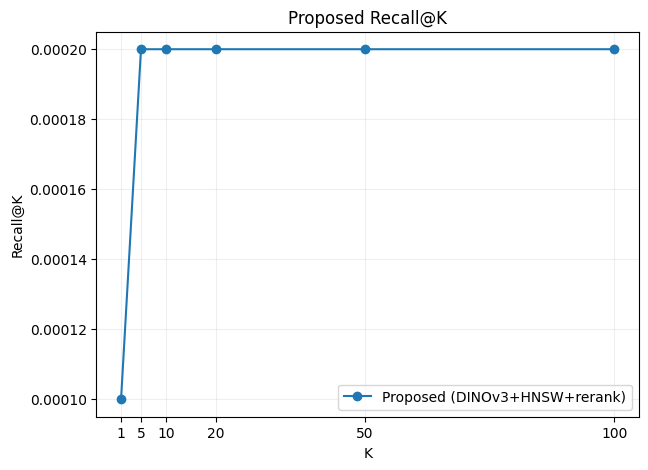

Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/recall_at_k.png


In [36]:
plt.figure(figsize=(7, 5))
label = "Proposed (DINOv3+HNSW" + ("+rerank)" if ENABLE_RERANKING else ")")
plt.plot(KS, [metrics[f"Recall@{k}"] for k in KS], marker="o", label=label)
plt.xlabel("K")
plt.ylabel("Recall@K")
plt.title("Proposed Recall@K")
plt.xticks(KS)
plt.grid(alpha=0.2)
plt.legend()

recall_plot = OUTPUT_DIR / "recall_at_k.png"
plt.savefig(recall_plot, dpi=200, bbox_inches="tight")
plt.show()

print("Saved:", recall_plot)

## 16. HNSW vs HNSW + Re-ranking (ablation)

So sánh **A: DINOv3 + HNSW** với **B: DINOv3 + HNSW + metadata
re-ranking**, dùng CHUNG tập candidate Top-N đã lấy từ HNSW (không
encode/search lại) — nên phần chênh lệch Recall@K/mAP đến từ đúng một biến
duy nhất: có hay không bước metadata re-ranking.

### Cell 39 — Tính Recall@K/mAP cho HNSW-only vs HNSW+reranking

In [37]:
retrieved_class_matrix_hnsw_only = class_matrix_from_ids(
    retrieval_ids_pre_rerank, gallery_df["class_id"].to_numpy()
)

metrics_hnsw_only = {}
for k in KS:
    recalls = [
        recall_at_k(retrieved_class_matrix_hnsw_only[i], query_class_ids[i], k)
        for i in range(num_eval_queries)
    ]
    metrics_hnsw_only[f"Recall@{k}"] = float(np.mean(recalls))

aps_hnsw_only = [
    average_precision(retrieved_class_matrix_hnsw_only[i], query_class_ids[i])
    for i in range(num_eval_queries)
]
metrics_hnsw_only["mAP"] = float(np.mean(aps_hnsw_only))

ablation_df = pd.DataFrame({
    "HNSW only": metrics_hnsw_only,
    "HNSW + reranking": metrics,
})
display(ablation_df)

ablation_df.to_csv(OUTPUT_DIR / "ablation_hnsw_vs_reranking.csv")
print("Saved:", OUTPUT_DIR / "ablation_hnsw_vs_reranking.csv")

if not ENABLE_RERANKING:
    print(
        "\u26a0 ENABLE_RERANKING=False ở Cell Configuration -> hai cột trên "
        "giống hệt nhau (đều là HNSW-only). Bật ENABLE_RERANKING=True và chạy "
        "lại notebook để xem tác động thật của reranking."
    )
else:
    for k in KS:
        delta = metrics[f"Recall@{k}"] - metrics_hnsw_only[f"Recall@{k}"]
        sign = "cải thiện" if delta > 0 else ("không đổi" if delta == 0 else "giảm")
        print(f"Recall@{k}: reranking {sign} {abs(delta):.4f}")
    delta_map = metrics["mAP"] - metrics_hnsw_only["mAP"]
    print(f"mAP: reranking {'cải thiện' if delta_map > 0 else 'giảm'} {abs(delta_map):.4f}")

,HNSW only,HNSW + reranking
Recall@1,0.0001,0.000100
Recall@5,0.0001,0.000200
Recall@10,0.0001,0.000200
Recall@20,0.0001,0.000200
Recall@50,0.0001,0.000200
Recall@100,0.0001,0.000200
mAP,0.0001,0.000196


Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/ablation_hnsw_vs_reranking.csv
Recall@1: reranking không đổi 0.0000
Recall@5: reranking cải thiện 0.0001
Recall@10: reranking cải thiện 0.0001
Recall@20: reranking cải thiện 0.0001
Recall@50: reranking cải thiện 0.0001
Recall@100: reranking cải thiện 0.0001
mAP: reranking cải thiện 0.0001


# QUALITATIVE

## 17. Retrieval Visualization

### Cell 40 — Chọn 1 query để minh họa

In [38]:
QUAL_QUERY_INDEX = 0
QUAL_TOP_K = 5

q = eval_query_df.iloc[QUAL_QUERY_INDEX]
result = proposed_retrieve(
    q["image_path"], proposed_preprocessor, dinov3, hnsw_retriever, gallery_df,
    candidate_k=RERANK_CANDIDATES, final_k=QUAL_TOP_K,
    enable_reranking=ENABLE_RERANKING, alpha_visual=ALPHA_VISUAL, device=DEVICE,
)

q_indices = result["indices"][0]
q_scores_top = result["scores"][0]

print("Query image:", q["image_path"])
print("GT class:", q["class_id"])

qual_rows = []
for rank, (idx, score) in enumerate(zip(q_indices, q_scores_top), start=1):
    if idx < 0:
        continue
    g = gallery_df.iloc[int(idx)]
    qual_rows.append({
        "rank": rank,
        "image_id": int(g["image_id"]),
        "class_id": int(g["class_id"]),
        "similarity": float(score),
        "correct": int(g["class_id"]) == int(q["class_id"]),
        "image_path": g["image_path"],
    })

qual_df = pd.DataFrame(qual_rows)
display(qual_df)

Query image: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/data/raw/Stanford_Online_Products/bicycle_final/111085122871_6.JPG
GT class: 1


,rank,image_id,class_id,similarity,correct,image_path
0,1,184,36,1.000000,False,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...
1,2,59795,11356,0.670596,False,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...
2,3,62496,11751,0.583371,False,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...
3,4,366,62,0.580126,False,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...
4,5,60609,11480,0.558952,False,/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualPr...


### Cell 41 — Vẽ query + Top-K

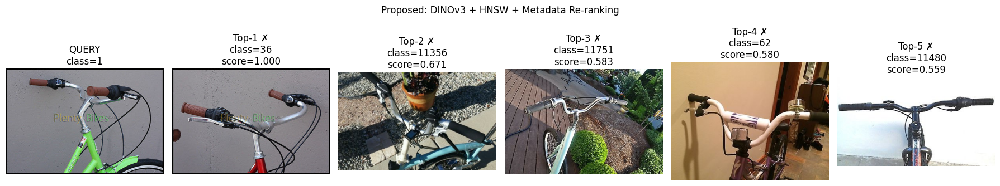

Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/qualitative_query_0000.png


In [39]:
def show_proposed_retrieval(query_row, result_df, save_path=None):
    n = len(result_df)
    plt.figure(figsize=(3 * (n + 1), 4))

    ax = plt.subplot(1, n + 1, 1)
    ax.imshow(Image.open(query_row["image_path"]).convert("RGB"))
    ax.set_title(f"QUERY\nclass={query_row['class_id']}")
    ax.axis("off")

    for i, (_, row) in enumerate(result_df.iterrows(), start=1):
        ax = plt.subplot(1, n + 1, i + 1)
        ax.imshow(Image.open(row["image_path"]).convert("RGB"))
        correct_text = "\u2713" if row["correct"] else "\u2717"
        ax.set_title(
            f"Top-{row['rank']} {correct_text}\n"
            f"class={row['class_id']}\nscore={row['similarity']:.3f}"
        )
        ax.axis("off")

    title = "Proposed: DINOv3 + HNSW" + (" + Metadata Re-ranking" if ENABLE_RERANKING else "")
    plt.suptitle(title)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.show()


qual_path = OUTPUT_DIR / "qualitative_query_0000.png"
show_proposed_retrieval(q, qual_df, save_path=qual_path)
print("Saved:", qual_path)

## 18. Export Qualitative Results

### Cell 42 — Xuất nhiều qualitative cases

Export qualitative examples:   0%|          | 0/20 [00:00<?, ?it/s]

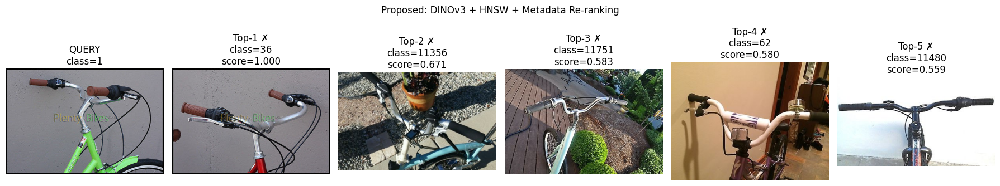

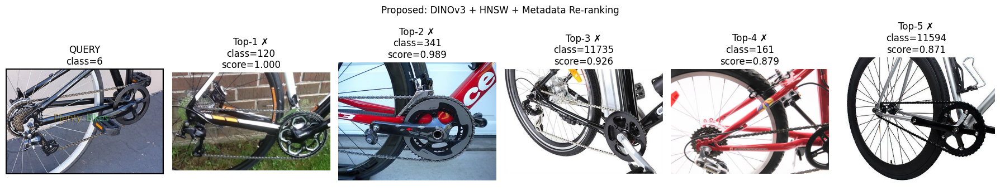

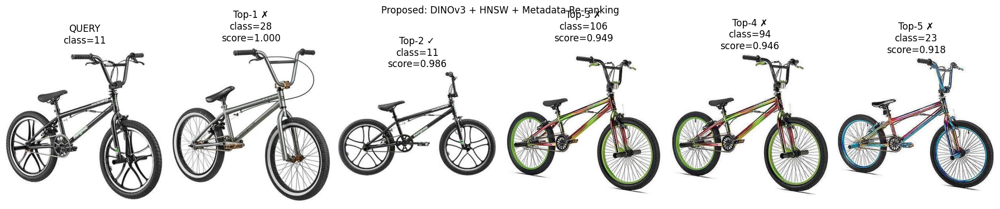

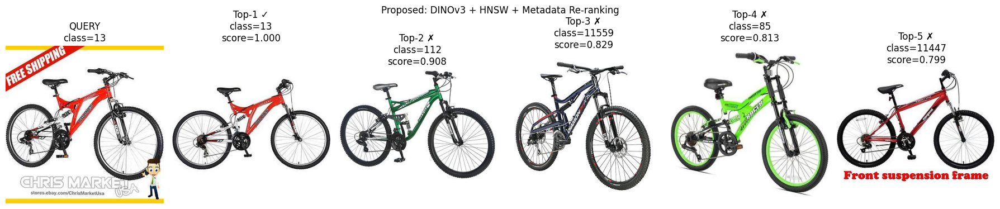

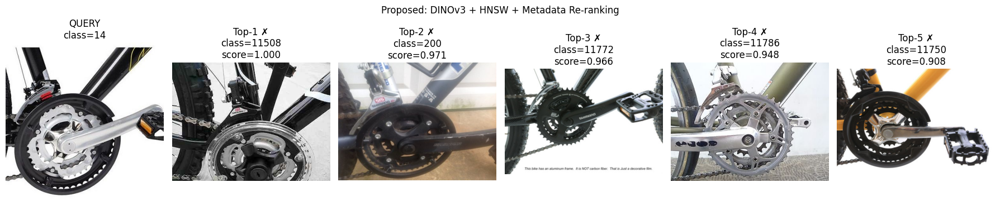

...

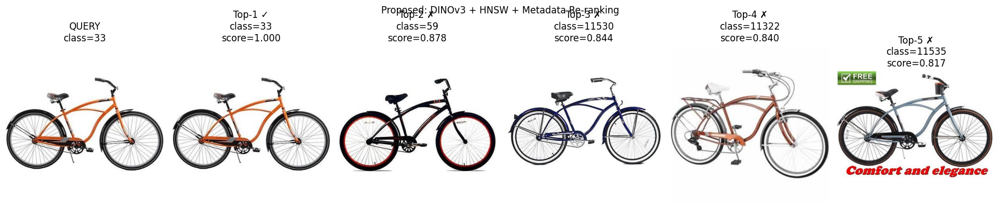

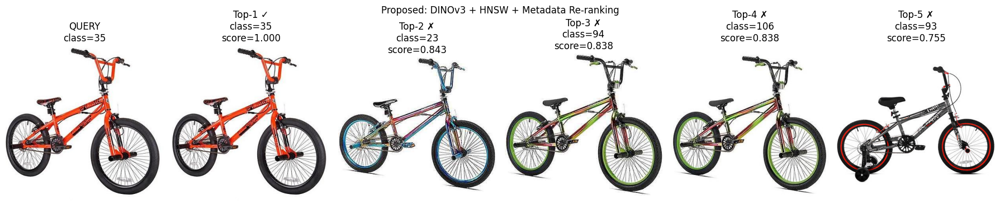

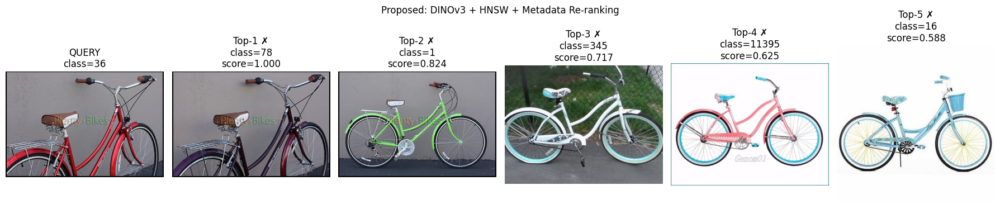

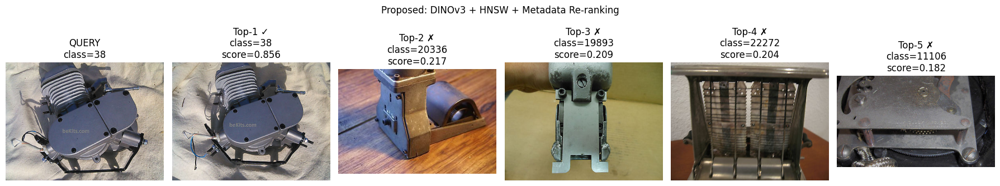

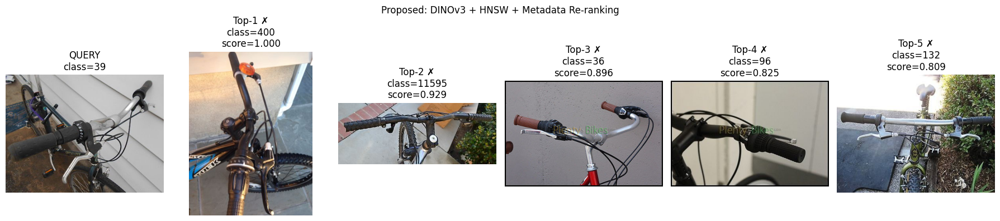

Qualitative directory: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/qualitative


In [40]:
QUAL_DIR.mkdir(parents=True, exist_ok=True)
n_qual = min(N_QUALITATIVE, len(eval_query_df))

for qi in tqdm(range(n_qual), desc="Export qualitative examples"):
    q = eval_query_df.iloc[qi]
    result = proposed_retrieve(
        q["image_path"], proposed_preprocessor, dinov3, hnsw_retriever, gallery_df,
        candidate_k=RERANK_CANDIDATES, final_k=QUAL_TOP_K,
        enable_reranking=ENABLE_RERANKING, alpha_visual=ALPHA_VISUAL, device=DEVICE,
    )
    indices, scores = result["indices"][0], result["scores"][0]

    rows = []
    for rank, (idx, score) in enumerate(zip(indices, scores), start=1):
        if idx < 0:
            continue
        g = gallery_df.iloc[int(idx)]
        rows.append({
            "rank": rank,
            "class_id": int(g["class_id"]),
            "similarity": float(score),
            "correct": int(g["class_id"]) == int(q["class_id"]),
            "image_path": g["image_path"],
        })

    result_df = pd.DataFrame(rows)
    save_path = QUAL_DIR / f"query_{qi:04d}.png"
    show_proposed_retrieval(q, result_df, save_path=save_path)
    plt.close("all")

print("Qualitative directory:", QUAL_DIR)

### Cell 43 — Tổng hợp qualitative accuracy

In [41]:
qualitative_summary = []

for qi in range(n_qual):
    q = eval_query_df.iloc[qi]
    result = proposed_retrieve(
        q["image_path"], proposed_preprocessor, dinov3, hnsw_retriever, gallery_df,
        candidate_k=RERANK_CANDIDATES, final_k=QUAL_TOP_K,
        enable_reranking=ENABLE_RERANKING, alpha_visual=ALPHA_VISUAL, device=DEVICE,
    )
    indices = result["indices"][0]
    valid = indices >= 0
    retrieved_classes = gallery_df.iloc[indices[valid]]["class_id"].to_numpy()

    qualitative_summary.append({
        "query_index": qi,
        "query_image_id": int(q["image_id"]),
        "query_class_id": int(q["class_id"]),
        "top1_correct": bool(len(retrieved_classes) > 0 and retrieved_classes[0] == q["class_id"]),
        "top5_correct_count": int(np.sum(retrieved_classes == q["class_id"])),
    })

qualitative_summary_df = pd.DataFrame(qualitative_summary)
display(qualitative_summary_df)
qualitative_summary_df.to_csv(OUTPUT_DIR / "qualitative_summary.csv", index=False)
print("Saved:", OUTPUT_DIR / "qualitative_summary.csv")

,query_index,query_image_id,query_class_id,top1_correct,top5_correct_count
0,0,7,1,False,0
1,1,35,6,False,0
2,2,63,11,False,1
3,3,69,13,True,1
4,4,75,14,False,0
5,5,87,16,True,1
6,6,95,17,False,0
7,7,109,21,True,1
8,8,111,22,False,1
9,9,114,23,False,0


Saved: /kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed/qualitative_summary.csv


# FINAL

## 19. Save Experiment Report

`metrics.json`, `latency.json` và `config.json` đã được lưu ở phần
Evaluation (mục 15). Cell dưới chỉ in báo cáo tổng kết ra màn hình.

## 20. Final Summary

### Cell 44 — Final proposed report

In [42]:
print("=" * 70)
print("PROPOSED EXPERIMENT COMPLETED")
print("=" * 70)

print("\nDataset")
print("Gallery:", len(gallery_df))
print("Query  :", len(eval_query_df))
print("Classes:", gallery_df["class_id"].nunique())

print("\nEncoder")
print("DINOv3 :", MODEL_SOURCE)
print("Feature dimension:", dinov3.dim)

print("\nIndex")
print("FAISS HNSW")
print("M             :", HNSW_M)
print("efConstruction:", HNSW_EF_CONSTRUCTION)
print("efSearch      :", HNSW_EF_SEARCH)

print("\nRe-ranking")
print("Enabled     :", ENABLE_RERANKING)
print("Candidate K :", RERANK_CANDIDATES)
if ENABLE_RERANKING:
    print("alpha_visual:", ALPHA_VISUAL)

print("\nMetrics")
for k in KS:
    key = f"Recall@{k}"
    print(f"Recall@{k}: {metrics[key]:.4f}")
print(f"mAP: {metrics['mAP']:.4f}")

print("\nLatency")
print(f"Encoding    mean: {latency_stats['encoding_mean_ms']:.2f} ms")
print(f"HNSW search mean: {latency_stats['search_mean_ms']:.2f} ms")
print(f"Re-ranking  mean: {latency_stats['rerank_mean_ms']:.2f} ms")
print(f"End-to-end  mean: {latency_stats['end_to_end_mean_ms']:.2f} ms")

print("\nMemory")
print(f"Embedding : {memory_stats['gallery_embeddings_MB']:.2f} MB")
print(f"HNSW index: {memory_stats['hnsw_index_MB']:.2f} MB")

print("\nOutput directory:")
print(OUTPUT_DIR)

PROPOSED EXPERIMENT COMPLETED

Dataset
Gallery: 10000
Query  : 10000
Classes: 10000

Encoder
DINOv3 : facebook/dinov3-vitb16-pretrain-lvd1689m
Feature dimension: 768

Index
FAISS HNSW
M             : 32
efConstruction: 200
efSearch      : 64

Re-ranking
Enabled     : True
Candidate K : 100
alpha_visual: 0.85

Metrics
Recall@1: 0.0001
Recall@5: 0.0002
Recall@10: 0.0002
Recall@20: 0.0002
Recall@50: 0.0002
Recall@100: 0.0002
mAP: 0.0002

Latency
Encoding    mean: 29.67 ms
HNSW search mean: 0.47 ms
Re-ranking  mean: 1.18 ms
End-to-end  mean: 80.42 ms

Memory
Embedding : 29.30 MB
HNSW index: 31.89 MB

Output directory:
/kaggle/working/DINOv3-FAISS-HNSW-SOP-VisualProductSearch/outputs/proposed


# Output expected

Sau khi chạy xong Notebook 03:

```text
outputs/
└── proposed/
    ├── gallery_embeddings.npy
    ├── gallery_metadata.csv
    ├── gallery_hnsw.index
    ├── retrieval_results.npy
    ├── retrieval_scores.npy
    ├── metrics.json
    ├── latency.json
    ├── config.json
    ├── recall_at_k.png
    ├── ablation_hnsw_vs_reranking.csv
    ├── qualitative_query_0000.png
    ├── qualitative_summary.csv
    │
    └── qualitative/
        ├── query_0000.png
        ├── query_0001.png
        └── ...
```

và `data/sampled/` không đổi (Notebook 03 không ghi thêm split mới).

## Bảng tóm tắt

| Section | Input | Output | Offline/Online |
|---|---|---|---|
| DINOv3 extraction | Gallery images | embeddings | Offline |
| HNSW indexing | embeddings | index | Offline |
| Query encoding | Query image | query embedding | Online |
| HNSW search | query embedding | Top-M | Online |
| Re-ranking | Top-M + metadata | Top-K | Online |
| Evaluation | retrieval results | Recall/mAP | Offline |
| Latency | retrieval pipeline | ms | Online |
| Memory | embeddings/index | MB | Offline |

## Liên kết với các notebook khác

- **Notebook 01 — Sampling**: tạo `data/sampled/sop_20k.csv` (20K ảnh SOP,
  stratified theo `class_id`). Notebook 03 chỉ đọc, không sampling lại.
- **Notebook 02 — Baseline**: tạo `data/sampled/baseline_gallery.csv` /
  `baseline_query.csv` — Notebook 03 dùng lại NGUYÊN split này để so sánh
  công bằng, và giữ đúng quy ước đặt tên metric (`Recall@K`, `mAP`) cùng các
  key latency (`encoding_mean_ms`, `search_mean_ms`, `end_to_end_mean_ms`,
  ...) đã dùng ở Notebook 02.
- **Notebook 04 — Comparison/Evaluation**: đọc
  `outputs/baseline/metrics.json` + `latency.json` và
  `outputs/proposed/metrics.json` + `latency.json` để vẽ biểu đồ so sánh
  trực tiếp Recall@K, mAP, latency, memory giữa hai pipeline.
- **Notebook 05 — Qualitative**: có thể tái sử dụng
  `outputs/proposed/qualitative/` và `outputs/baseline/qualitative/` để
  dựng các ví dụ so sánh cạnh nhau (baseline vs proposed) cho cùng một
  query.

In [43]:
# ==============================================================================
# KAGGLE OUTPUT & RESULTS PREVIEW BLOCK (INDEPENDENT BLOCK)
# ==============================================================================
import os
import shutil
from pathlib import Path

IS_KAGGLE = 'KAGGLE_KERNEL_RUN_TYPE' in os.environ or os.path.exists('/kaggle/working')

if IS_KAGGLE:
    print("--- Kaggle Output & Preview ---")
    
    # 1. Print preview
    print("Preview of proposed metrics:")
    metrics_path = Path("outputs/proposed/metrics.json")
    if metrics_path.exists():
        with open(metrics_path, 'r') as f:
            print(f.read())
            
    # 2. Export to /kaggle/working
    print("\nCopying results to Kaggle output directory (/kaggle/working)...")
    dest = Path("/kaggle/working/outputs/proposed")
    dest.mkdir(parents=True, exist_ok=True)
    src = Path("outputs/proposed")
    if src.exists():
        for item in src.iterdir():
            if item.is_file():
                shutil.copy(item, dest)
                print(f"Copied {item.name} to {dest}")
        qual_src = src / "qualitative"
        qual_dest = dest / "qualitative"
        if qual_src.exists():
            qual_dest.mkdir(parents=True, exist_ok=True)
            for item in qual_src.iterdir():
                if item.is_file():
                    shutil.copy(item, qual_dest)


--- Kaggle Output & Preview ---
Preview of proposed metrics:

Copying results to Kaggle output directory (/kaggle/working)...
